# Рынок заведений общественного питания Москвы

## Введение

**Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.**

**Цель:** исследовать рынок Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Задачи:**

- Изучить сткрутуру данных;
- Провести предобработку данных;
- Провести анализ данных;
- Провести анализ данных о кофейнях;
- Сделать отчёт.

**Описание данных:**

moscow_places.csv:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## План

[Перейти к разделу "Загрузка данных"](#Загрузка-данных-и-изучение-общей-информации)

[Перейти к разделу "Предобработка данных"](#Предобработка-данных)

[Перейти к разделу "Анализ данных"](#Анализ-данных)

[Перейти к разделу "Открытие кофейни"](#Открытие-кофейни)

[Перейти к разделу "Рекомендация по открытию кофейни"](#Рекомендация-по-открытию-кофейни)


## Загрузка данных и изучение общей информации

In [1]:
# импортируем библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MultipleLocator
pd.set_option("display.float_format", "{:.2f}".format)
import warnings
warnings.simplefilter('ignore')
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import datetime as dt
import json
import re

In [2]:
# задаем стиль графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":200, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

In [3]:
# загрузка данных
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('moscow_places.csv')

In [4]:
def df_information(df):
    print('Изучение данных:')
    display(df.head())
    print('*'*50)
    print(df.info())
    print('*'*50)
    print(df.describe())
    print('*'*50)
    print('Количество пропусков:')
    print(df.isna().sum())
    print('*'*50)
    print('Количество дубликатов:')
    print(df.duplicated().sum())
    
df_information(df)

Изучение данных:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
*****

- Обнаружены пропуски в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. На данном этапе не будем ничего удалять, чтобы не исказить результаты исследования.
- Явных дубликатов не обнаружено, посмотрим далее неявные.

## Предобработка данных

In [5]:
print(df.duplicated(subset=['name', 'address']).sum())

0


In [6]:
df['name'].value_counts()

Кафе                                           189
Шоколадница                                    120
Домино'с Пицца                                  76
Додо Пицца                                      74
One Price Coffee                                71
                                              ... 
Донер & клаб                                     1
Буонамичи - Итальянский ресторан - пиццерия      1
КП МЭИ                                           1
Guru                                             1
Вафли, крепы, два яйца                           1
Name: name, Length: 5614, dtype: int64

In [7]:
# Уберем апострофы и приведем все названия к нижнему регистру
df['name'] = df['name'].str.replace("'", "").str.lower()
df['name'].value_counts()

кафе                189
шоколадница         120
доминос пицца        78
додо пицца           74
one price coffee     72
                   ... 
донер и бургер        1
cedro albero          1
смартфуд              1
подсолнухи            1
чайхана космос        1
Name: name, Length: 5511, dtype: int64

In [8]:
#поищем дубликаты по совпадению наименования и адреса
df.duplicated(subset=['name', 'address']).sum()

3

In [9]:
#посмотрим данные дубликаты
duplicates = df[df.duplicated(subset=['name', 'address'], keep=False)]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188.00
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


Видим, что данные записи являются дубликатами, однако в них расходятся категории заведения, возможно это просто ошибка при сборе данных

In [10]:
rows_count = df.shape[0]
print("Первичное количество строк:", rows_count)
# Удалим дубликаты по столбцам name и address
df.drop_duplicates(subset=['name', 'address'], inplace=True)
# Проверим
rows_count_2 = df.shape[0]
print("Количество строк после удаления:", rows_count_2)
print(df.duplicated(subset=['name', 'address']).sum())

Первичное количество строк: 8406
Количество строк после удаления: 8403
0


In [11]:
# Преобразование уникальных значений в список и объединение их в одну строку
unique_names = df['name'].sort_values().unique().tolist()
all_names = ", ".join(unique_names)
len(all_names)

72354

In [12]:
# вывод уникальных значений
unique_names = df['name'].sort_values().unique()
for name in unique_names:
    print(name)


#кешбэккафе
+39 pizzeria mozzarella bar
1 этаж
1-я креветочная
10 идеальных пицц
1001 ночь
100ловая
100лоффка
13
13 chef doner
15 kitchen+bar
15-й шар
16 июня
16 тонн
18 грамм
1901 comfort food zone
1у
2 типа
2-й этаж
2046
21 век
22 акра кофе&хлеб
2u-ту-ю
3 ступени
351 bar
4 сезона
4.2. bar
4/1 restaurant
42 coffee shop
47
495
4friends coffee
4tuna cafe&grill
5 stars coffee
55.709201, 37.392257
6 am bread kitchen
6 рукопожатий
69 раков
7 сэндвичей
7 элемент
7/12
8 oz
8 вафель
8 зёрен
8 пончиков
800°с contemporary steak
8bit pizza
9 bar coffe
9 bar coffee
9 зёрен
a-cafe
abc coffee roasters
acai family
accent
adams chicken
adria mare
ahava
air coffee
al halal
al33 пиццерия бар боттега
all day
alma
alternative coffee
aly’s poke
amande
amarena
americano black coffee & food
amg cafe
ami chaise
amore grande
amsterdam bar
andy coffee
angel cakes city
angel cakes patriki
ann joy
anri bakery
antalya
anvil cafe
aq kitchen
aquarium
arabix
arch 1908
archie
arcus bar and food
armibaker
aroma
art & 

Точечно были отобраны некоторые неявные дубликаты, поэтому далее приведем наименования к более корректному виду.

In [13]:
# Создаем словарь с переименованиями
rename_dict = {
    'чемпион суши - суши, роллы, wok, пицца, донер': 'чемпион',
    'топ chick': 'топ чик',
    'фо бо и том ям': 'фо бо & том ям',
    'халва кофе': 'халва',
    'хинкали - gали': 'хинкали gали',
    'хинкали gали!': 'хинкали gали',
    'хинкали-gaли': 'хинкали gали',
    'хинкали-gали!': 'хинкали gали',
    'хинкали-gали': 'хинкали gали',
    'хлеба&зрелищ пиццерия': 'хлеба&зрелищ',
    'пекарня булошная № 1': 'булошная № 1',
    'булошная №': 'булошная № 1', 
    'буханка': 'пекарня буханка',
    'перекрёсток кафе': 'перекресток',
    'перекрёсток': 'перекресток',
    'правда кофе остоженка 42/2': 'правда кофе',
    'регистан 24': 'регистан',
    'доминос': 'доминос пицца',
    'дэди, кафе': 'дэди',
    'панда кофе': 'панда',
    'ив. дурдинъ': 'иван дурдинъ',
    'изюм чайхана халяль': 'изюм',
    'кап кап': 'кап энд кап',
    'кофе & moloko': 'кофе&moloko',
    'кулинариум - кулинария, пироги, салаты': 'кулинариум',
    'кутята coffee shop': 'кутята',
    'лепим и варим в европолисе': 'лепим и варим',
    'лепим и варим пельменная в саду': 'лепим и варим',
    'лепим и варим пельменная на рынке': 'лепим и варим',
    'лепим и варим пельменная на рынке № 2': 'лепим и варим',
    'мэри групп': 'мэри',
    'мясо на углях & пекарня': 'мясо на углях',
    'ом-кафе': 'ом',
    'алло! пицца': 'алло пицца',
    'аль-бухари': 'аль бухари',
    'белла чао пицца и кофе': 'белла чао',
    'буфетрина. 2': 'буфетрина',
    'в парке вкуснее!': 'в парке вкуснее',
    'гастрорюмочная шесть-you-шесть': 'гастрорюмочная шесть you шесть',
    'глобус, ресторан': 'глобус ресторан',
    'да, еда': 'да еда',
    'white fox cafe': 'white fox',
    'wild bean cafe': 'wild bean',
    'wok box': 'wok & box',
    'yasha gourmet': 'yasha',
    'surf coffee x takeoff': 'surf coffee',
    'surf coffee x amen': 'surf coffee',
    'surf coffee x flat': 'surf coffee',
    'surf coffee x akademik': 'surf coffee',
    'surf coffee x highway': 'surf coffee',
    'surf coffee x lips': 'surf coffee',
    'surf coffee x lovely': 'surf coffee',
    'surf coffee x otto': 'surf coffee',
    'surf coffee x sababa': 'surf coffee',
    'surf coffee x shine': 'surf coffee',
    'surf coffee x sport': 'surf coffee',
    'surf coffee x studio': 'surf coffee',
    'surf coffee x secret spot': 'surf coffee',
    'shakeup': 'shake up',
    'phobo': 'pho bo',
    'рhово': 'pho bo',
    'pride coffee': 'pride',
    'prime cafe': 'prime',
    'mátes pizza': 'mátes',
    'mátes pizza&bar': 'mátes',
    'niqa patisserie & cafe tverskoy': 'niqa patisserie & cafe',
    'bloom-n-brew baum': 'bloom-n-brew',
    'bloom-n-brew factoria': 'bloom-n-brew',
    'cofefest': 'cofe fest',
    '9 bar coffe': '9 bar coffee',
    'true cost никуда не едем': 'true cost',
    'udcкафе upside down cake': 'udcкафе',
    'veranda grill cafe': 'veranda',
    'vip wok and sushi': 'vip wok & sushi',
    'wasabi, суши-бар': 'wasabi',
    'wake up cafe': 'wake up',
    'saperavi cafe': 'saperavi',
    'shakeup': 'shake up',
    'lucky eye. ближневосточной lounge bar': 'lucky eye',
    'mainfood': 'main food',
    'mátes pizza': 'mátes',
    'mátes pizza&bar': 'mátes',
    'ngon moscow': 'ngon',
    'niqa patisserie & cafe tverskoy': 'niqa patisserie & cafe',
    'k-town korean bbq': 'k-town',
    'its сот-кофейня': 'its сот - кофейня',
    'jeffreys coffee': 'jeffreys',
    'jeffreys coffeeshop': 'jeffreys',
    'jeffreys кофе и сидр': 'jeffreys',
    'jeffrey’s coffeeshop': 'jeffreys',
    'iq кофе': 'iq coffee',
    'hanoi food&drinks': 'hanoi',
    'garage café': 'garage',
    'french bakery sedelice': 'french bakery',
    'for you coffee lab': 'for you',
    'fresh for you & cofe': 'fresh for you',
    'friends forever botanica': 'friends forever',
    'grape wine & kitchen': 'grape',
    'festa&тесто': 'festa & тесто',
    'florentini city cafe': 'florentini',
    'estetica cafe': 'estetica',
    'express кафе': 'express',
    'dormouse coffee shop': 'dormouse',
    'drive cafe': 'drive',
    'drive café': 'drive',
    'corner cafe&kitchen': 'corner cafe & kitchen',
    'bổ':'bo',
    'cantina city free flow cafe': 'cantina city',
    'cofefest': 'cofe fest',
    'arzon food': 'arzon',
   'саббаба': 'сабаба',
    'сакура place': 'сакура',
    'чайкоv lavazza': 'чайковский',
    'ош сити': 'ош',
    'ош халяль': 'ош',
    'spot poke & bowls': 'spot',
    'raw to go kitchen': 'raw to go'
}

# Применяем переименование к столбцу 'name'
df['name'] = df['name'].replace(rename_dict)

Также было выявлено некорректное название заведения, изучим его подробнее

In [14]:
incorr_names = df[df['name'].isin([
    '55.709201, 37.392257'
])]
incorr_names

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5875,"55.709201, 37.392257",кафе,"Москва, Беловежская улица, 22",Западный административный округ,"чт круглосуточно, перерыв 10:00–20:00; сб круг...",55.71,37.39,4.20,NaN,NaN,NaN,NaN,0,NaN


В сети по данному адресу не удалось найти кафе, так что просто удалим данную строку

In [15]:
indexes_to_drop = df[df['name'] == '55.709201, 37.392257'].index
df = df.drop(indexes_to_drop)

In [16]:
unique_names = df['name'].sort_values().unique().tolist()
all_names = ", ".join(unique_names)
len(all_names)

70353

In [17]:
# снова посмотрим дубликаты по совпадению наименования и адреса
df.duplicated(subset=['name', 'address']).sum()

4

In [18]:
# выведем их
duplicates = df[df.duplicated(subset=['name', 'address'], keep=False)]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
599,в парке вкуснее,кафе,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.85,37.49,2.20,NaN,NaN,NaN,NaN,0,NaN
600,в парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.85,37.48,2.20,NaN,NaN,NaN,NaN,1,NaN
3206,udcкафе,кофейня,"Москва, Кутузовский проспект, 57",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.73,37.48,4.30,средние,Средний счёт:700–1000 ₽,850.00,NaN,1,96.00
3376,udcкафе,кофейня,"Москва, Кутузовский проспект, 57",Западный административный округ,"пн-чт 09:00–21:40; пт,сб 09:00–22:40; вс 09:00...",55.73,37.48,4.30,NaN,NaN,NaN,NaN,0,96.00
5764,vip wok & sushi,быстрое питание,"Москва, Можайское шоссе, 45Б",Западный административный округ,"ежедневно, 11:00–23:00",55.72,37.41,4.20,NaN,NaN,NaN,NaN,0,16.00
5850,vip wok & sushi,быстрое питание,"Москва, Можайское шоссе, 45Б",Западный административный округ,"ежедневно, 11:00–23:00",55.72,37.41,4.20,NaN,NaN,NaN,NaN,0,16.00
7635,estetica,кафе,"Москва, Кировоградская улица, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.61,37.61,4.20,NaN,NaN,NaN,NaN,0,60.00
7743,estetica,кафе,"Москва, Кировоградская улица, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.61,37.61,4.30,NaN,NaN,NaN,NaN,0,60.00


In [19]:
# Удалим дубликаты по столбцам name и address
df.drop_duplicates(subset=['name', 'address'], inplace=True)
# Проверим
print(df.duplicated(subset=['name', 'address']).sum())

0


In [20]:
unique_names = df['name'].sort_values().unique().tolist()
all_names = ", ".join(unique_names)
len(all_names)

70353

In [21]:
#посмотрим, какие категории имеются в данных
df['category'].value_counts()

кафе               2375
ресторан           2042
кофейня            1411
бар,паб             764
пиццерия            633
быстрое питание     602
столовая            315
булочная            256
Name: category, dtype: int64

In [22]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                891
Северо-Восточный административный округ     890
Западный административный округ             847
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

- В полных столбцах датасета находится информация о 8406 строках. Однако было обнаружено множество пропусков в столбцах: `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. 
- Названия столбцов указаны корректно во всем датасете.
- Тип столбцов указан корректно во всем датасете.

In [23]:
# создадим столбец с улицей
df['street'] = df['address'].str.split(', ').str[1]
# создадим столбец с режимом работы (круглосуточно или нет)
df['is_all_day'] = df['hours'].str.contains('ежедневно, круглосуточно')
# проверим
df.head(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_all_day
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица,False
3,dormouse,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00,Клязьминская улица,False


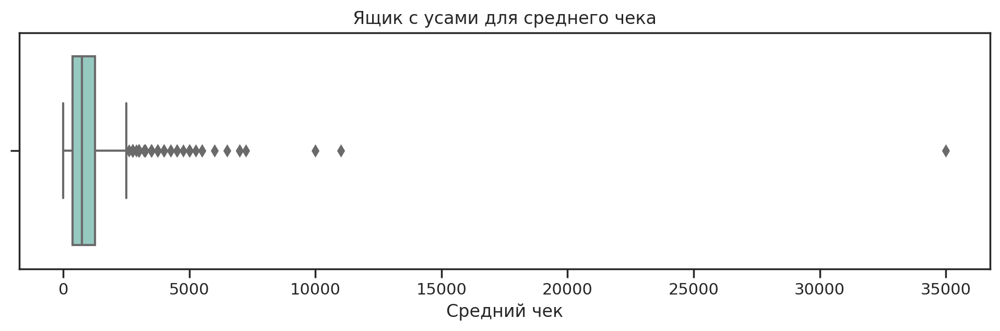

In [24]:
plt.figure(figsize=(12, 3))
sns.set_palette("Set3")
sns.boxplot(x=df['middle_avg_bill'])
plt.title('Ящик с усами для среднего чека')
plt.xlabel('Средний чек')
plt.show()

Видим один явный выброс среднего чека заведения, который примерно на уровне 35000 руб. Рассмотрим подробнее

In [25]:
high_avg_bill = df[df['middle_avg_bill'] > 30000]
high_avg_bill

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_all_day
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.66,37.65,4.10,высокие,Средний счёт:20000–50000 ₽,35000.00,NaN,0,100.00,Каширское шоссе,True


Такое заведение всего одно и называется просто "кафе". Удалим его для более корректного дальнейшего анализа.

In [26]:
df = df.drop(7177)

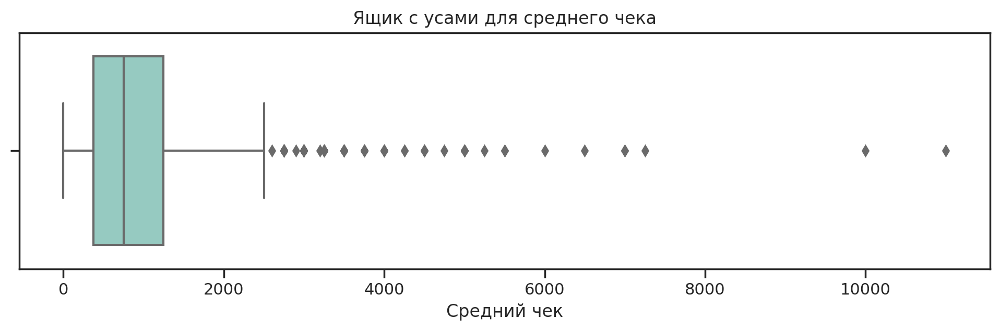

In [27]:
# снова посмотрим на ящик с усами
plt.figure(figsize=(12, 3))
sns.boxplot(x=df['middle_avg_bill'])
plt.title('Ящик с усами для среднего чека')
plt.xlabel('Средний чек')
plt.show()

Выглядит уже более правдоподобно, хотя и есть выбросы, но они имеют место быть

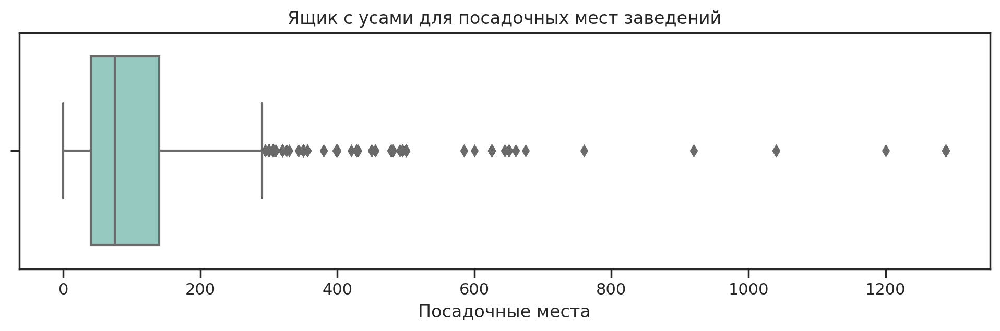

In [28]:
# анализируем количество посадочных мест
plt.figure(figsize=(12, 3))
sns.boxplot(x=df['seats'])
plt.title('Ящик с усами для посадочных мест заведений')
plt.xlabel('Посадочные места')
plt.show()

In [29]:
high_seats = df[df['seats'] > 500]
high_seats

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_all_day
1326,нам,"бар,паб","Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.80,37.52,4.20,NaN,NaN,NaN,NaN,1,625.00,Ленинградский проспект,False
1351,максима пицца,пиццерия,"Москва, Ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.81,37.51,4.30,выше среднего,Средний счёт:1500–1800 ₽,1650.00,NaN,0,625.00,Ленинградский проспект,False
1355,страдивари,ресторан,"Москва, Ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.80,37.51,4.20,выше среднего,Средний счёт:1000–2000 ₽,1500.00,NaN,1,625.00,Ленинградский проспект,False
1367,академия,пиццерия,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.81,37.52,4.20,средние,Средний счёт:1000–1200 ₽,1100.00,NaN,1,625.00,Ленинградский проспект,False
1380,север-метрополь,кофейня,"Москва, Ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.80,37.51,4.60,NaN,NaN,NaN,NaN,1,625.00,Ленинградский проспект,False
1385,чайхона на соколе,кафе,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.80,37.52,4.30,средние,Средний счёт:400–800 ₽,600.00,NaN,0,625.00,Ленинградский проспект,False
1393,кулинарная лавка братьев караваевых,кафе,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.81,37.52,4.30,NaN,Средний счёт:500–800 ₽,650.00,NaN,1,625.00,Ленинградский проспект,False
1442,abc coffee roasters,кофейня,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.81,37.52,4.50,средние,Цена чашки капучино:220–270 ₽,NaN,245.00,0,625.00,Ленинградский проспект,False
1446,9 bar coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.81,37.51,4.30,NaN,Цена чашки капучино:60–150 ₽,NaN,105.00,1,625.00,Ленинградский проспект,False
1464,находка,ресторан,"Москва, Ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.80,37.52,4.90,NaN,NaN,NaN,NaN,1,625.00,Ленинградский проспект,False


Путем анализа данных заведений в открытых источниках, я выявила, что в них гораздо меньше мест, чем указано в датасете. Предполагаю, что был добавлен лишний 0, поэтому поделим на 10.

In [30]:
seats_over_500 = df[df['seats'] > 500]
count_seats_over_500 = seats_over_500.shape[0]
count_seats_over_500

56

In [31]:
df.loc[df['seats'] > 500, 'seats'] /= 10

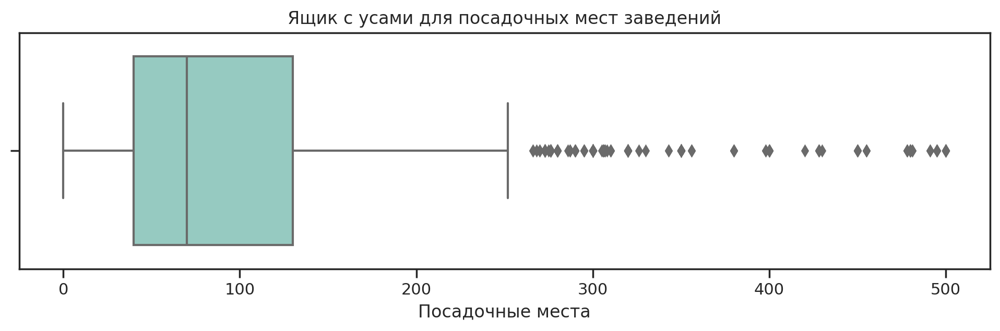

In [32]:
# анализируем количество посадочных мест второй раз
plt.figure(figsize=(12, 3))
sns.boxplot(x=df['seats'])
plt.title('Ящик с усами для посадочных мест заведений')
plt.xlabel('Посадочные места')
plt.show()

Оставим так, поскольку все равно существуют места для банкентных залов с большим количеством гостей

## Анализ данных

In [33]:
# Создаем цветовую палитру
# Определяем цвета с помощью seaborn
colors_seaborn = {
    'кафе': sns.color_palette("Set3")[0],
    'ресторан': sns.color_palette("Set3")[1],
    'кофейня': sns.color_palette("Set3")[2],
    'бар,паб': sns.color_palette("Set3")[3],
    'пиццерия': sns.color_palette("Set3")[4],
    'быстрое питание': sns.color_palette("Set3")[5],
    'столовая': sns.color_palette("Set3")[6],
    'булочная': sns.color_palette("Set3")[7]
}

# Преобразуем цвета в формат RGB
colors_rgb = {key: f'rgb{tuple(map(int, (color[0] * 255, color[1] * 255, color[2] * 255)))}' for key, 
              color in colors_seaborn.items()}

### Виды категорий заведений 

In [34]:
# Группировка по категориям и подсчет количества объектов
category_count = df.groupby('category')['name'].count().reset_index()
category_count.columns = ['category', 'count']
category_count = category_count.sort_values(by='count', ascending=False)

fig = px.bar(category_count, x='category', y='count', 
             title='Распределение объектов по категориям (по убыванию)',
             labels={'category': 'Категория', 'count': 'Количество'},
             color='category',
             color_discrete_map=colors_rgb)

fig.update_layout(title_x=0.5, xaxis_title=None, yaxis_title='Количество', width=900, 
                  height=400, showlegend=False)
fig.show()

На первом месте по количеству заведений - кафе, на втором - рестораны, на третьем - кофейни. Булочные оказались на последнем месте.

### Количество посадочных мест в объектах по категориям

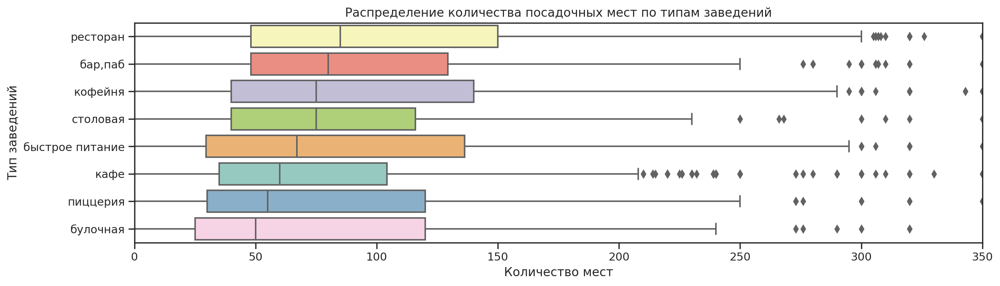

In [35]:
order = df.groupby(["category"])["seats"].median().sort_values(ascending=False).index

plt.figure(figsize=(15, 4))
ax = sns.boxplot(data=df, x='seats', y='category', order=order, palette=colors_seaborn)

plt.title('Распределение количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.xlim(0, 350)
plt.show()

In [36]:
df['category'].value_counts()

кафе               2375
ресторан           2041
кофейня            1411
бар,паб             764
пиццерия            633
быстрое питание     602
столовая            315
булочная            256
Name: category, dtype: int64

- Лидерами по количеству посадочных мест являются рестораны, пабы/бары и кофейни. Их медианные значения также выше остальных.
- Отстающими по количеству мест типами объектов являются булочные, пиццерии. Медианное значение также ниже остальных.
- Кажется у нас имеются серъезные проблемы с качеством данных в колонке seats. Медианное значение в булочной достигает 50-ти мест, значит проблема некорректного ввода — не единичная.

### Соотношение сетевых и несетевых заведений

In [37]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5195
1,1,3202


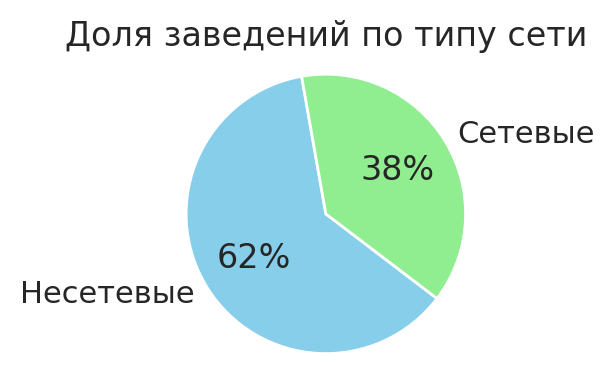

In [38]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
plt.figure(figsize=(2, 2))
plt.pie(chain['count'], labels=['Несетевые', 'Сетевые'], autopct='%1.0f%%', startangle=100, colors=['skyblue', 'lightgreen'])
plt.title('Доля заведений по типу сети')
plt.axis('equal')
plt.show()

- По диаграмме видно, что сетевые места занимают лишь 38% от общего числа мест в г.Москва.

### Какие категории заведений чаще являются сетевыми?

In [39]:
chain_objects = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['category', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain']
chain_objects = chain_objects.sort_values(['count', 'chain'], ascending = False)
chain_objects

,category,chain,count
6,кафе,0,1596
12,ресторан,0,1312
7,кафе,1,779
13,ресторан,1,729
9,кофейня,1,719
8,кофейня,0,692
0,"бар,паб",0,596
4,быстрое питание,0,370
11,пиццерия,1,330
10,пиццерия,0,303


In [40]:
chain_objects = df[df['chain'] == 1]
non_chain_objects = df[df['chain'] == 0]
# Группируем данные 
grouped_chain = chain_objects.groupby(['category']).size().reset_index(name='count_chain')
grouped_non_chain = non_chain_objects.groupby(['category']).size().reset_index(name='count_non_chain')
merged_data = pd.merge(grouped_chain, grouped_non_chain, on='category', how='outer')

# Сортируем по убыванию 
merged_data['total'] = merged_data['count_chain'] + merged_data['count_non_chain']
merged_data = merged_data.sort_values(by='total', ascending=False)
fig = go.Figure()
fig.add_trace(go.Bar(x=merged_data['category'], y=merged_data['count_chain'], name='Сетевые', 
                     marker_color='#8DD3C7'))
fig.add_trace(go.Bar(x=merged_data['category'], y=merged_data['count_non_chain'], name='Несетевые', 
                     marker_color='#FBC5BE'))

for i, row in merged_data.iterrows():
    total = row['total']
    chain_percent = (row['count_chain'] / total) * 100
    fig.add_annotation(x=row['category'], y=row['count_chain'], text=f"{chain_percent:.0f}%", 
                       showarrow=False, font=dict(color='#000000', size=10), xshift=0, yshift=-8)

for i, row in merged_data.iterrows():
    total = row['total']
    non_chain_percent = (row['count_non_chain'] / total) * 100
    fig.add_annotation(x=row['category'], y=row['count_chain'] + row['count_non_chain'], 
                       text=f"{non_chain_percent:.0f}%", showarrow=False,
                       font=dict(color='#000000', size=10), xshift=0, yshift=5) 
fig.update_layout(title='Количество сетевых и несетевых объектов по типу заведения',
                  xaxis_title='Тип заведения',
                  yaxis_title='Количество объектов',
                  barmode='stack',
                  title_x=0.5,
                  legend_title='Тип объекта',
                  template='plotly_white')

fig.show()

- Сетевые пиццерии, кофейни и булочные превосходят по количеству несетевые заведения тех же типов.
- Наиболее популярными сетевыми заведениями города Москвы являются кафе, рестораны и кофейни.
- Наименее популярными сетевыми заведениями оказались столовые.
- В то же время, в категории несетевых заведений также лидируют кафе и рестораны.

### Топ-15 популярных сетей в Москве

In [41]:
top = df[df['chain'] == 1]
top15 = top.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top15 = top15.rename(columns={'district':'count'})
top15 = top15.sort_values('count', ascending = False).reset_index().head(15)
top15

,name,rating,category,count
0,шоколадница,4.20,кофейня,120
1,доминос пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


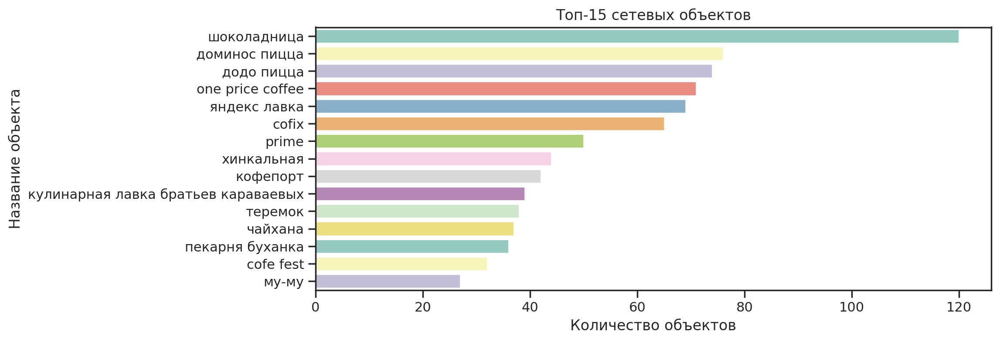

In [42]:
# Фильтрация данных
top = df[df['chain'] == 1]
top15 = top.groupby('name').agg({'rating': 'median', 'category': pd.Series.mode, 'district': 'count'})
top15 = top15.rename(columns={'district': 'count'})
top15 = top15.sort_values('count', ascending=False).reset_index().head(15)

plt.figure(figsize=(10, 4))
sns.barplot(x='count', y='name', data=top15, palette='Set3')
plt.title('Топ-15 сетевых объектов')
plt.xlabel('Количество объектов')
plt.ylabel('Название объекта')
plt.show()

- В самом топ-1 находится Шоколадница, на втором месте - Домино'с пицца, на третьем - Додо Пицца. 
- Самая редкая сеть для Москвы (в топе-15) - Му-Му.
- Самое популярное место относится к категории "кофейня", два следующих за ним - пиццерии.

In [43]:
# количество объектов каждой категории в ТОП-15
category_counts_top15 = top15['category'].value_counts()
category_counts_top15

кофейня     5
кафе        4
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

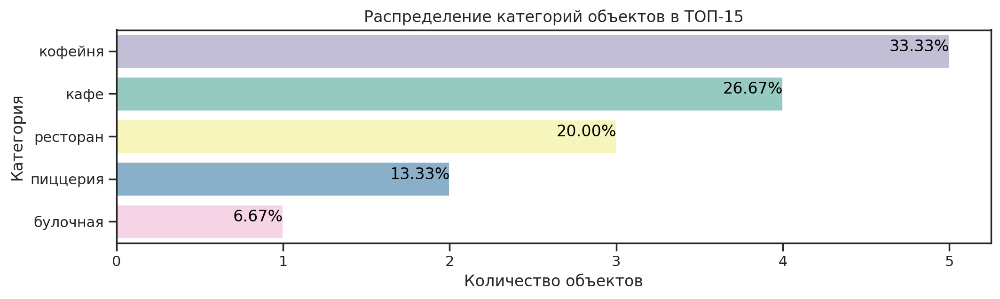

In [44]:
total_count = category_counts_top15.sum()
percentages = (category_counts_top15 / total_count) * 100
plt.figure(figsize=(12, 3))
ax = sns.barplot(x=category_counts_top15.values, y=category_counts_top15.index, palette=colors_seaborn)
for i, percentage in enumerate(percentages):
    ax.text(category_counts_top15.values[i], i, f'{percentage:.2f}%', color='black', ha="right")
plt.title('Распределение категорий объектов в ТОП-15')
plt.xlabel('Количество объектов')
plt.ylabel('Категория')
plt.show()

Таким образом, мы видим, что наиболее популярной категорией заведений в ТОП-15 оказалась категория "кофейни". Далее по уменьшению популярности идут кафе, рестораны, пиццерии,булочные.

###  Административные районы Москвы 

In [45]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

### Количество заведений каждой категории по районам

In [46]:
district_top = df.groupby(['district', 'category']).agg({'address': 'count', 'rating': 'mean'})
district_top = district_top.rename(columns={'address':'count'})
district_top = district_top.reset_index().sort_values('district', ascending=False)
district_top.head(8)

,district,category,count,rating
71,Южный административный округ,столовая,44,4.26
70,Южный административный округ,ресторан,201,4.21
69,Южный административный округ,пиццерия,73,4.26
68,Южный административный округ,кофейня,131,4.23
67,Южный административный округ,кафе,263,4.09
66,Южный административный округ,быстрое питание,85,4.10
65,Южный административный округ,булочная,25,4.34
64,Южный административный округ,"бар,паб",68,4.28


In [47]:
# Группируем данные по районам и подсчитываем общее количество объектов в каждом районе
district_total_count = district_top.groupby('district')['count'].sum().reset_index()
# Присоединяем общее количество объектов к исходным данным
district_top_sorted = district_top.merge(district_total_count, on='district', suffixes=('', '_total'))
# Сортируем данные сначала по общему количеству объектов, а затем по каждой категории
district_top_sorted = district_top_sorted.sort_values(by=['count_total', 'count'], ascending=[False, False])
# Создаем цветовую палитру 
category_colors = [colors_rgb.get(category, 'grey') for category in district_top_sorted['category'].unique()]
# Визуализируем
fig = px.bar(district_top_sorted, 
             x='count', 
             y='district', 
             color='category', 
             orientation='h', 
             title='Количество объектов общественного питания по районам с разбивкой по категориям',
             labels={'count': 'Количество объектов', 'district': 'Район', 'category': 'Категория'},
             color_discrete_map=dict(zip(district_top_sorted['category'].unique(), category_colors)),
             text=district_top_sorted['count'].apply(lambda x: str(x)))
fig.update_layout(width=900, height=400)
fig.update_traces(textfont=dict(size=10))
fig.show()

In [48]:
# Рассчитываем относительные значения
district_top_sorted['relative_count'] = district_top_sorted['count'] / district_top_sorted['count_total']
category_colors = [colors_rgb.get(category, 'grey') for category in district_top_sorted['category'].unique()]

fig = px.bar(district_top_sorted, 
             x='relative_count', 
             y='district', 
             color='category', 
             orientation='h', 
             title='Относительное количество объектов общественного питания по районам с разбивкой по категориям',
             labels={'relative_count': 'Относительное количество объектов', 'district': 'Район', 'category': 'Категория'},
             color_discrete_map=dict(zip(district_top_sorted['category'].unique(), category_colors)),
             text=district_top_sorted['relative_count'].apply(lambda x: f"{x*100:.2f}%"))
fig.update_layout(width=900, height=400)
fig.update_traces(textposition='inside')
fig.show()

- Имеем 9 регионов в датасете.
- ЦАО самый располагаемый заведениями общественного питания.
- В ЦАО наиболее популярны бары и пабы, кафе, кофейни и рестораны.
- В других же округах (помимо ЦАО) бары и пабы находятся на последних местах по популярности.
- Наименее популярные категории по всем округам - булочныи и столовые. 
- Самые популярные заведения в разрезе всех округов - рестораны, кафе и кофейни.

### Распределение средних рейтингов по категориям заведений

In [49]:
rat = df.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
rat

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


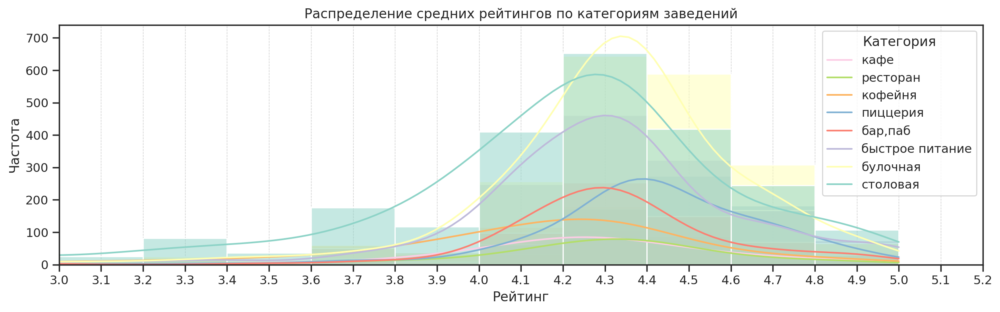

In [50]:
plt.figure(figsize=(15, 4))
sns.histplot(data=df, x='rating', hue='category', kde=True, bins=20)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Частота')
plt.legend(title='Категория', labels=df['category'].unique())
# Установка начальной точки оси X
plt.gca().set_xlim(3, None)

plt.gca().xaxis.set_major_locator(MultipleLocator(0.1))
plt.grid(axis='x', linestyle='--', linewidth=0.5)
plt.show()

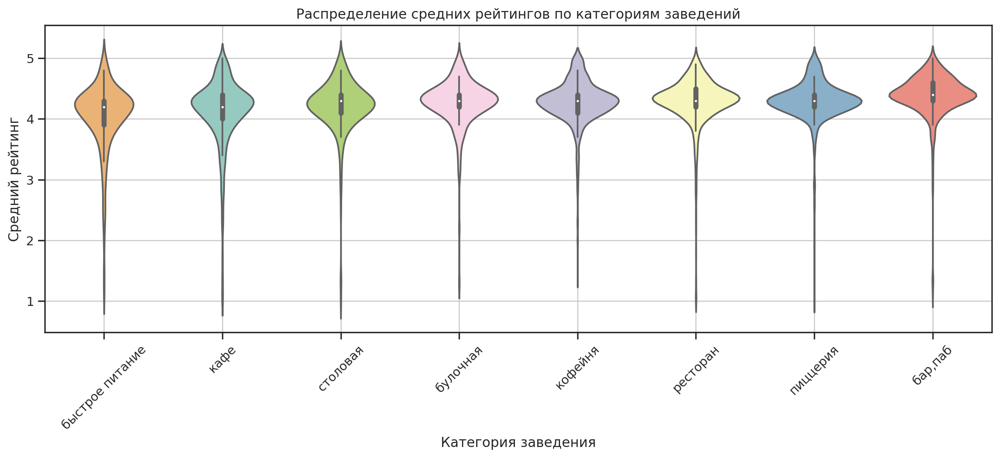

In [51]:
mean_ratings = df.groupby('category')['rating'].mean().sort_values()
mean_ratings_df = pd.DataFrame({'category': mean_ratings.index, 'mean_rating': mean_ratings.values})
# Сортируем
df_sorted = df.merge(mean_ratings_df, on='category').sort_values(by='mean_rating')

plt.figure(figsize=(15, 5))
sns.violinplot(data=df_sorted, x='category', y='rating', palette=colors_seaborn)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

**Посмотрим без выбросов:**

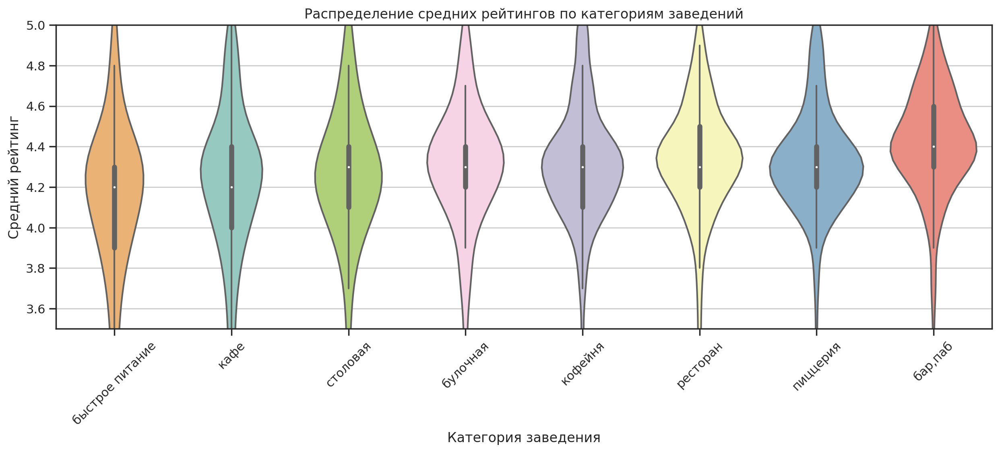

In [52]:
mean_ratings = df.groupby('category')['rating'].mean().sort_values()
mean_ratings_df = pd.DataFrame({'category': mean_ratings.index, 'mean_rating': mean_ratings.values})
# Сортируем
df_sorted = df.merge(mean_ratings_df, on='category').sort_values(by='mean_rating')

plt.figure(figsize=(15, 5))
sns.violinplot(data=df_sorted, x='category', y='rating', palette=colors_seaborn)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.ylim(3.5, 5)
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

- Наивысший средний рейтинг приходится на категорию бары и пабы (примерно 4.39).  
- Далее идут пиццерии, рестораны, булочные, кофейни с небольшим отрывом. (4.27-4.30). 
- Хуже всего средний рейтинг оказался у ресторанов быстрого питания (4.05).
- Хочется отметить, что столовые чаще остальных получают низкий рейтинг, не дотягивающий даже до 4 баллов, хотя средний рейтинг по столовым не самый худший.

### Фоновая картограмма со средним рейтингом заведений каждого района

In [53]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)

In [54]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [55]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu', 
    fill_opacity=0.7,      
    line_opacity=0.5,     
    line_color='green',   
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_1)

# выводим карту
map_1

- Самый наивысший средний рейтинг заведений наблюдается в ЦАО (более 4.33).
- В САО также высокий средний рейтинг заведений (более 4.24).
- Самый худший средний рейтинг заведений в ЮВАО (менее 4.15).

### Отображение всех заведений на карте

In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)
map_2

- Опять же видим, что большинство заведений расположены в ЦАО.
- Наименьшее количество заведений на юге и востоке Москвы.

### Топ-15 улиц по количеству заведений

In [57]:
streets_moscow = df[df['street'].notnull()]
top_15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top_15_streets.columns = ['street_name', 'count']
# Добавим также категории к улицам
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)
# Топ-15
top_15_new = streets_category[streets_category['street_name'].isin(top_15_streets['street_name'])]
# Проверим
top_15_new

,street_name,category,count
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


In [58]:
fig = px.bar(top_15_new,
             x='count',
             y='street_name',
             template='plotly_white',                   
             color='category',
             color_discrete_map=colors_rgb
            )
fig.update_layout(title='Количество заведений в разрезе улиц и категорий',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder': 'total ascending'}
                 )
fig.show()

- Первой в топе-15 выступает улица Мира с большим отрывом от остальных. На втором месте -Профсоюзная, на третьем - проспект Вернадского. Все заведения на ВДНХ имеют адрес прописки — пр.Мира, полагю из-за этого такой сильный отрыв данной улицы от остальных.
- Наиболее популярные категории заведений на улице Мира - кофейни, кафе и рестораны. 
- Наименее популярная категория заведений на улице Мира - столовые. 
- В целом по всем улицам ресторанов, кафе и кофеень больше, чем остальных заведений.
- Улицей с наименьшим количеством заведений оказалась Пятницкая.

### Улицы, на которых находится только один объект общепита

In [59]:
# Подсчитываем количество заведений на каждой улице
street_counts = df['street'].value_counts()

# Отбираем улицы, на которых расположено только одно заведение общественного питания
single_catering_streets = street_counts[street_counts == 1].index

# Фильтруем датафрейм по этим улицам
one_catering = df[df['street'].isin(single_catering_streets)]
one_catering

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_all_day
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.89,37.49,4.10,средние,Средний счёт:300–500 ₽,400.00,NaN,0,180.00,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.46,4.50,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldis,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.69,37.75,4.70,NaN,NaN,NaN,NaN,0,90.00,улица Шкулёва,False
8294,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.70,37.74,4.40,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.69,37.79,4.10,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.68,37.76,4.30,NaN,NaN,NaN,NaN,1,40.00,Новороссийская улица,False


In [60]:
# Координаты Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# Создаем карту Москвы
map_one_catering = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=11)
# Создаем кластер маркеров
marker_cluster = MarkerCluster().add_to(map_one_catering)
# Добавляем маркеры для каждого заведения
for index, row in one_catering.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"{row['name']} ({row['category']})",
        icon=None
    ).add_to(marker_cluster)
# Отображаем карту
map_one_catering

**Улицы, на которых расположен лишь один объект общественного питания, раскиданы по всей Москве, карта не дала ясно понять причины. Попробуем рассмотреть категории таких заведений.**

In [61]:
# Выводим таблицу с категориями заведений, которые расположены на улицах с только одним заведением
one_catering_categories = df[df['street'].isin(one_catering['street'])]['category'].value_counts().reset_index()
one_catering_categories.columns = ['category', 'count']
one_catering_categories

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


- Самыми популярными заведениями, которые находятся на улице в единственном числе, стали кафе.
- На втором месте -рестораны.
- На третьем - кофейни.
- Самыми непопулярными стали булочные.

### Средние чеки заведений Москвы

In [62]:
# Считаем медиану среднего чека для каждого района
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,575.00
1,Западный административный округ,1000.00
2,Северный административный округ,650.00
3,Северо-Восточный административный округ,500.00
4,Северо-Западный административный округ,700.00
5,Центральный административный округ,1000.00
6,Юго-Восточный административный округ,450.00
7,Юго-Западный административный округ,600.00
8,Южный административный округ,500.00


In [63]:
# Визуализируем средние чеки на карте Москвы
map_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    legend_name='Средний чек заведений по районам',
    fill_color='YlGnBu', 
    fill_opacity=0.7,      
    line_opacity=0.5,     
    line_color='white'
).add_to(map_4)
map_4

- Центральный и Западный округа имеют наибольший средний чек. 
- Заведения центра сами по себе располагают дорогими общепитами. А также из-за разности в соотношении заведений влияние на величину среднего чека может оказывать именно бОльшая доля ресторанов и пабов в ЦАО, в сравнении с южными или восточными районами Москвы.
- Северо-Восточный, Южный и Юго-Восточный административные округа имеют наименьший средний чек.

### Часы работы заведений и их зависимость от категории заведения

In [64]:
# Просмотр уникальных значений в столбце "hours"
unique_hours = df['hours'].unique()
print(unique_hours)

# Подсчет количества уникальных значений
num_unique_hours = len(unique_hours)
print("Количество уникальных значений:", num_unique_hours)


['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']
Количество уникальных значений: 1305


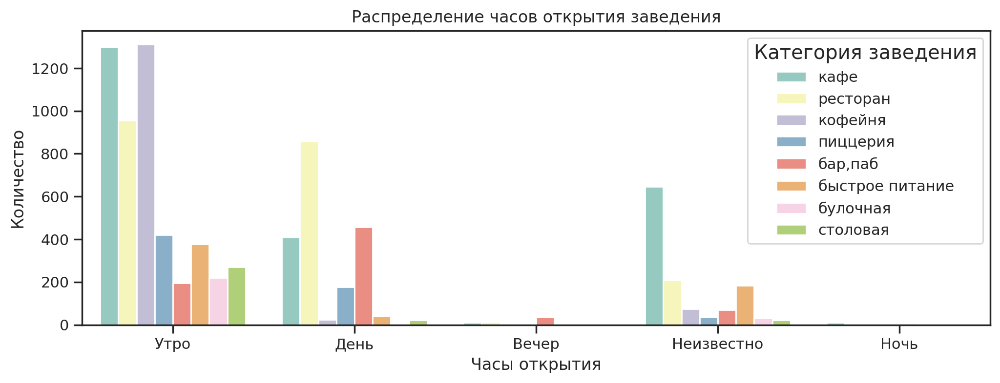

In [65]:
def categorize_hours(hours_str):
    time_pattern = r'\d{1,2}:\d{2}'
    times = re.findall(time_pattern, hours_str)
    if times:
        start_time = times[0]
        end_time = times[-1]
        start_hour, start_minute = map(int, start_time.split(':'))
        end_hour, end_minute = map(int, end_time.split(':'))

        # Категории временные
        if start_hour < 6 or start_hour >= 23:
            return 'Ночь'
        elif start_hour < 11:
            return 'Утро'
        elif start_hour < 15:
            return 'День'
        elif start_hour < 19:
            return 'Вечер'
        else:
            return 'Ночь'
    else:
        return 'Неизвестно'

df['hours'] = df['hours'].astype(str)
df['hours_category'] = df['hours'].apply(categorize_hours)

palette = [colors_seaborn[key] for key in df['category'].unique()]

plt.figure(figsize=(12, 4))
sns.countplot(data=df, x='hours_category', hue='category', palette=palette)
plt.title('Распределение часов открытия заведения')
plt.xlabel('Часы открытия')
plt.ylabel('Количество')
plt.legend(title='Категория заведения', title_fontsize='large', loc='upper right')
plt.show()

- Большинство заведений Москвы открываются в утренние часы.
- На втором месте - категории заведений, открывающихся днем.
- Вечером и ночью открываются крайне мало заведений.
- Кафе и рестораны открываются в основном утром и днем, небольшая часть также вечером и ночью.
- Также по утрам открывается много столовых, булочных.
- Днем помимо кафе и ресторанов открываются бары/пабы и пиццерии.

### Распределение категорий заведений по рейтингам

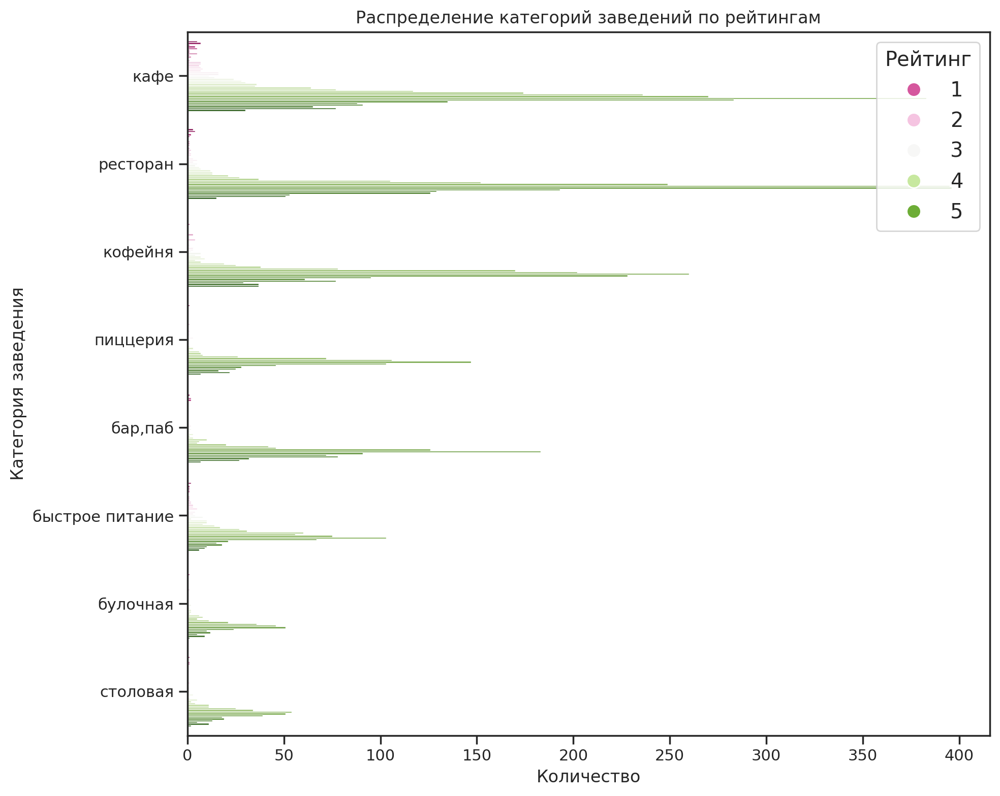

In [66]:
plt.figure(figsize=(10, 8))
sns.countplot(data=df, y='category', hue='rating', palette='PiYG', linewidth=0.5, orient='h')
plt.title('Распределение категорий заведений по рейтингам')
plt.xlabel('Количество')
plt.ylabel('Категория заведения')
legend_labels = [1, 2, 3, 4, 5]
legend_colors = sns.color_palette('PiYG', n_colors=len(legend_labels)) 
custom_legend = [plt.Line2D([0], [0], marker='o', color='w', label=label, 
                            markerfacecolor=color, markersize=10) 
                 for label, color in zip(legend_labels, legend_colors)]

plt.legend(custom_legend, legend_labels, title='Рейтинг', title_fontsize='large', loc='upper right', fontsize='large')
plt.tight_layout()
plt.show()

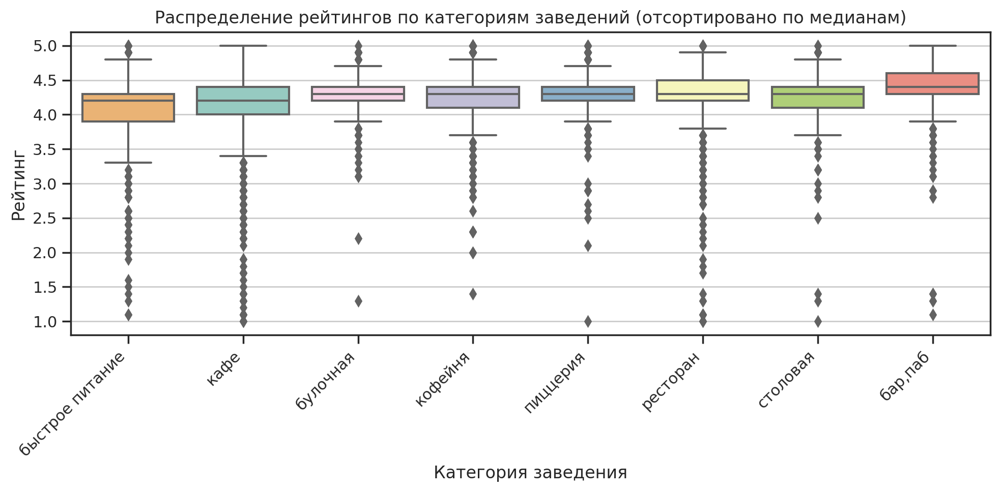

In [67]:
# Вычисляем медианы рейтингов 
median_ratings = df.groupby('category')['rating'].median().sort_values()
# Создаем палитру, отсортированную по медианам
palette = [colors_seaborn[category] for category in median_ratings.index]
# Создаем ящик с усами
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='category', y='rating', palette=palette, order=median_ratings.index)
plt.title('Распределение рейтингов по категориям заведений (отсортировано по медианам)')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.grid(True, axis='y')
plt.xticks(rotation=45, ha='right') 
plt.tight_layout()
plt.show()

- В целом по всем категориям преобладают рейтинги заведений примерно 4-4.5 баллов.
- Лучше всего рейтинги у баров и пабов.
- Хуже всего рейтинги у заведений быстрого питания.
- Также стоит заметить, что очень большое количество низких оценок получают кафе, рестораны, заведения быстрого питания.

### Средние чеки в заведениях с низким рейтингом

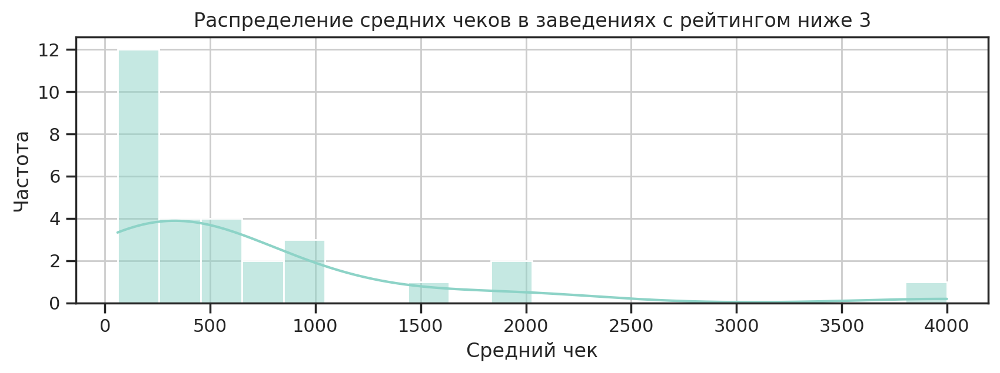

In [68]:
df['avg_bill'] = df['avg_bill'].str.extract(r'(\d+)').astype(float)
low_rating_df = df[df['rating'] < 3]
plt.figure(figsize=(10, 3))
sns.histplot(low_rating_df['avg_bill'], bins=20, kde=True, palette=colors_seaborn)
plt.title('Распределение средних чеков в заведениях с рейтингом ниже 3')
plt.xlabel('Средний чек')
plt.ylabel('Частота')
plt.grid(True)

plt.show()

In [69]:
low_rating_df['avg_bill'].shape[0]

209

**Выборка крайне мало для обоснованных выводов, однако по ней видно, что:**

- В заведениях с рейтингом ниже 3 в основном очень маленькие средние чеки. Полагаю, и качество блюд в таких заведениях не слишком высокое. 
- Видна и другая тенденция: в заведениях с высоким средним чеком также наблюдаются плохие оценки пользователей. В данном случае уже стоит разбираться более предметно, возможно это вызвано маленькими порциями блюд или другими моментами, характерными для дорогих ресторанов.

## Вывод по анализу данных

- На первом месте по количеству заведений - кафе, на втором - рестораны, на третьем - кофейни. Булочные оказались на последнем месте.
- Лидерами по количеству посадочных мест являются рестораны, пабы/бары и кофейни. Отстающими по количеству мест типами объектов являются булочные, пиццерии. 
- Сетевые места занимают лишь 38% от общего числа мест в г.Москва. Преобладают несетевые. Сетевые пиццерии, кофейни и булочные превосходят по количеству несетевые заведения тех же типов.
- Наиболее популярными сетевыми заведениями города Москвы являются кафе, рестораны и кофейни. Наименее популярными сетевыми заведениями оказались столовые.
- В самом топ-1 по сетевым заведениям находится Шоколадница, на втором месте - Домино'с пицца, на третьем - Додо Пицца. Самая редкая сеть для Москвы (в топе-15) - Му-Му. Самое популярное место относится к категории "кофейня", два следующих за ним - пиццерии.
- ЦАО самый располагаемый заведениями общественного питания. В нем наиболее популярны бары и пабы, кафе, кофейни и рестораны. В других же округах (помимо ЦАО) бары и пабы находятся на последних местах по популярности. Наименее популярные категории по всем округам - булочные и столовые.
- Наивысший средний рейтинг приходится на категорию бары и пабы (примерно 4.39). Далее идут пиццерии, рестораны, булочные, кофейни с небольшим отрывом. (4.27-4.30). Хуже всего средний рейтинг оказался у ресторанов быстрого питания (4.05).
- Первой в топе-15 выступает улица Мира с большим отрывом от остальных. На втором месте -Профсоюзная, на третьем - проспект Вернадского. Наиболее популярные категории заведений на улице Мира - кофейни, кафе и рестораны. Наименее популярная категория заведений на улице Мира - столовые. В целом по всем улицам ресторанов, кафе и кофеен больше, чем остальных заведений. Улицей с наименьшим количеством заведений оказалась Пятницкая.
- Самыми популярными заведениями, которые находятся на улице в единственном числе, стали кафе. На втором месте -рестораны. На третьем - кофейни.
- Центральный и Западный округа имеют наибольший средний чек.Северо-Восточный, Южный и Юго-Восточный административные округа имеют наименьший средний чек.
- Большинство заведений Москвы открываются в утренние часы. На втором месте - категории заведений, открывающихся днем. Вечером и ночью открывается крайне мало заведений.
- В заведениях с рейтингом ниже 3 в основном очень маленькие средние чеки. Полагаю, и качество блюд в таких заведениях не слишком высокое.

## Открытие кофейни

### Количество кофеен

In [70]:
coffee = df[df['category'] == 'кофейня']
len(coffee)

1411

### Особенности расположения кофеен

In [71]:
grouped_data = coffee.groupby('district')
count_per_dis = grouped_data.size()
count_per_dis

district
Восточный административный округ           105
Западный административный округ            149
Северный административный округ            192
Северо-Восточный административный округ    159
Северо-Западный административный округ      62
Центральный административный округ         428
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Южный административный округ               131
dtype: int64

In [72]:
# создаём карту Москвы
map_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_5)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
map_5

- Наибольшее количеество кофеен наблюдается в ЦАО.
- В северных районах Москвы также большое количество кофеен.
- В остальных районах кофеен не очень много, в сравнении с ЦАО.

### Наличие круглосуточных кофеен

In [73]:
print('Количество круглосуточных кофеен:', coffee['is_all_day'].sum())

Количество круглосуточных кофеен: 59


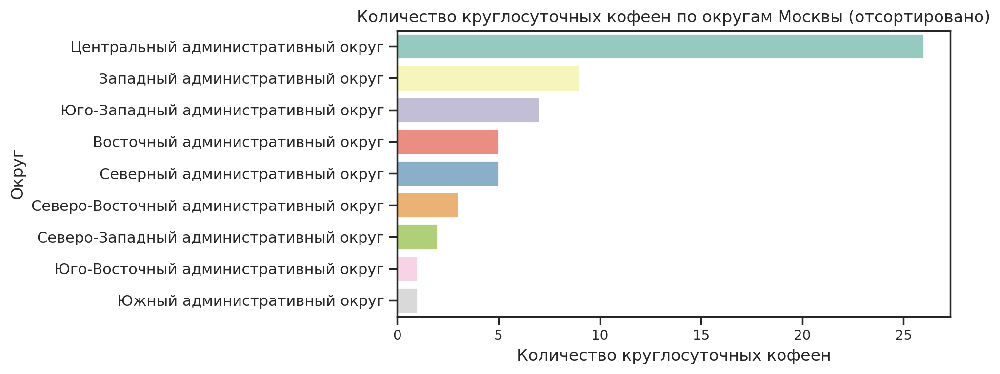

In [74]:
is_24_coffee = coffee[coffee['is_all_day'] == True]
district_counts = is_24_coffee['district'].value_counts().reset_index()\
                                          .rename(columns={'index': 'district', 'district': 'count'})
district_counts_sorted = district_counts.sort_values(by='count', ascending=False)

plt.figure(figsize=(10, 4))
sns.countplot(data=is_24_coffee, y='district', order=district_counts_sorted['district'], palette="Set3")
plt.title('Количество круглосуточных кофеен по округам Москвы (отсортировано)')
plt.xlabel('Количество круглосуточных кофеен')
plt.ylabel('Округ')
plt.xticks(fontsize=10)
plt.yticks(rotation=0, ha='right')
plt.tight_layout()
plt.show()

- Наибольшее количество круглосуточных кофеен находятся в ЦАО.
- Наименьшее количество круглосуточных кофеен находятся в ЮВАО и ЮАО.

### Рейтинги кофеен по районам

In [75]:
rat_cof = coffee.groupby('district', as_index=False)['rating']\
                .agg('mean').round(2)\
                .sort_values('rating', ascending=False)
rat_cof

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.30
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [76]:
# создаём карту
map_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rat_cof,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu', 
    fill_opacity=0.7,      
    line_opacity=0.5,     
    line_color='green'
).add_to(map_6)

# выводим карту
map_6

- Наиболее высокие рейтинги кофеен в ЦАО, СЗАО.
- Самые низкие рейтинги кофеен в СВАО и ЗАО.

### Стоимость чашки капучино 

In [77]:
# Найдем средние цены чашки кофе по округам
one_cup = coffee.groupby('district', as_index=False)['middle_coffee_cup'] \
                .agg('median') \
                .round(0) \
                .sort_values('middle_coffee_cup', ascending=False)
one_cup_mean = round(one_cup['middle_coffee_cup'].mean())

one_cup['middle_coffee_cup'] = one_cup['middle_coffee_cup'].map(int)
display(one_cup)
one_cup_mean

,district,middle_coffee_cup
7,Юго-Западный административный округ,198
5,Центральный административный округ,190
1,Западный административный округ,189
4,Северо-Западный административный округ,165
3,Северо-Восточный административный округ,162
2,Северный административный округ,159
8,Южный административный округ,150
6,Юго-Восточный административный округ,148
0,Восточный административный округ,135


166

In [78]:
sorted_districts = df.query('category == "кофейня"') \
                     .groupby('district')['middle_coffee_cup'] \
                     .median() \
                     .sort_values(ascending=False) \
                     .index
fig = px.box(df.query('category == "кофейня"'), 
             y='district', 
             x='middle_coffee_cup',  
             title='Средний чек за кофе по округам', 
             color='district',
             color_discrete_map=colors_seaborn,
             category_orders={'district': sorted_districts},
             orientation='h')  

fig.update_layout(xaxis_title='Рейтинг',  
                  yaxis_title='Район',
                  showlegend=False,
                  xaxis=dict(range=[0, 400])) 
fig.show()

- Если кофейня будет открываться в ЦАО, ЮЗАО  или ЗАО, то стоит рассчитывать на стоимость чашки кофе около 180 рублей.
- В других районах цена чашки кофе в среднем меньше. Стоит рассчитывать на стоимость в 150 рублей примерно.

**Посмотрим на выбросы в ценах на кофе**

In [79]:
expensive_coffee_shops = df.query('category == "кофейня" & middle_coffee_cup > 250')
expensive_coffee_shops.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_all_day,hours_category
151,шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.91,37.54,4.10,NaN,239.00,NaN,256.00,1,NaN,Дмитровское шоссе,False,Утро
240,шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.89,37.66,4.10,NaN,239.00,NaN,256.00,1,75.00,Широкая улица,False,Утро
343,шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.86,37.48,4.30,NaN,239.00,NaN,256.00,1,100.00,Фестивальная улица,False,Утро
360,шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.85,37.44,4.30,средние,239.00,NaN,256.00,1,130.00,Сходненская улица,False,Утро
455,шоколадница,кофейня,"Москва, улица Адмирала Макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.84,37.49,4.20,средние,239.00,NaN,256.00,1,80.00,улица Адмирала Макарова,False,Утро


- Самый дорогой кофе в Шоколаднице. Отсюда и выбросы.

### Топ-15 улиц для открытия кофейни

In [80]:
avg_price_by_street = df.groupby('street')['middle_coffee_cup'].median()
avg_rating_by_street = df.groupby('street')['rating'].mean()
top_price_streets = avg_price_by_street.sort_values(ascending=False).head(15)
top_rating_streets = avg_rating_by_street.sort_values(ascending=False).head(15)

# Преобразуем значения в целые числа и округляем
top_price_streets_rounded = top_price_streets.astype(int).round(0)

# Выводим ТОП-15 улиц 
print("ТОП-15 улиц с самой высокой средней ценой чашки кофе:")
print(top_price_streets_rounded)
print('*'*50)
print("\nТОП-15 улиц с самыми высокими средними рейтингами:")
print(top_rating_streets)

ТОП-15 улиц с самой высокой средней ценой чашки кофе:
street
Большая Семёновская улица       851
Большая Никитская улица         328
3-я Фрунзенская улица           320
Богословский переулок           300
Большая Сухаревская площадь     300
улица Гарибальди                291
3-й Крутицкий переулок          291
площадь Победы                  291
Милютинский переулок            290
Енисейская улица                287
Стремянный переулок             285
Мясницкая улица                 283
улица Серпуховский Вал          275
улица 1812 года                 275
2-й Сыромятнический переулок    275
Name: middle_coffee_cup, dtype: int64
**************************************************

ТОП-15 улиц с самыми высокими средними рейтингами:
street
1-й Рижский переулок                   5.00
парк Технических видов спорта          5.00
Гурьевский проезд                      5.00
3-я Радиаторская улица                 5.00
Архангельский переулок                 5.00
2-й Силикатный проезд          

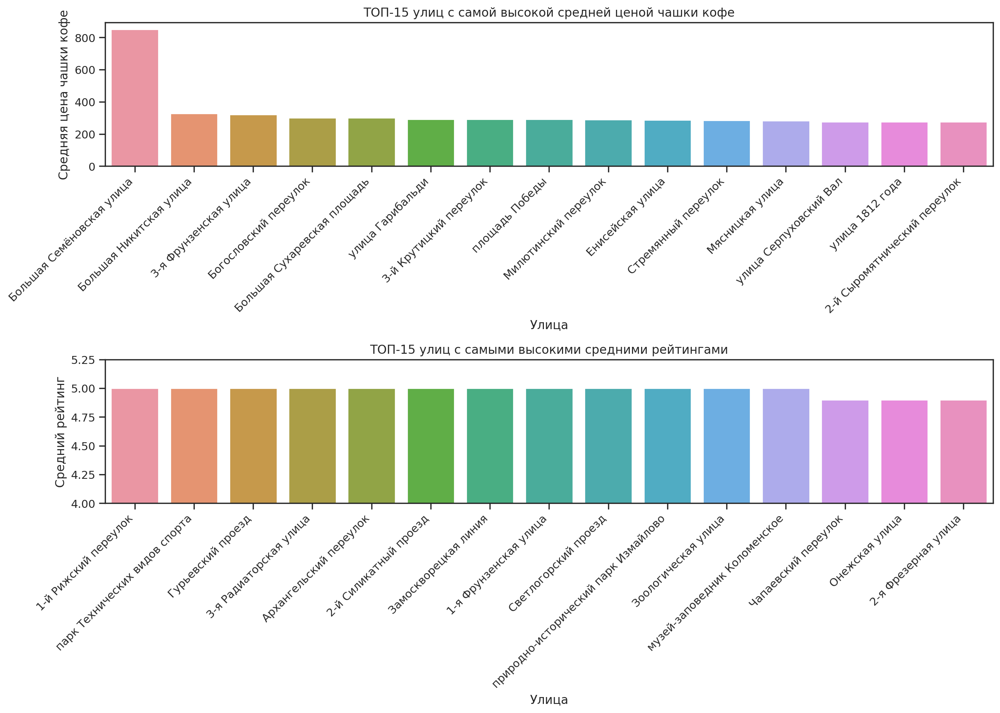

In [81]:
sns.set_palette("Set3")
fig, axs = plt.subplots(2, 1, figsize=(14, 10))

# Построение диаграммы 1
sns.barplot(ax=axs[0], x=top_price_streets_rounded.index, y=top_price_streets_rounded.values)
axs[0].set_title('ТОП-15 улиц с самой высокой средней ценой чашки кофе')
axs[0].set_xlabel('Улица')
axs[0].set_ylabel('Средняя цена чашки кофе')
axs[0].set_xticklabels(top_price_streets_rounded.index, rotation=45, ha='right')  # Установка подписей улиц

# Построение диаграммы 2
sns.barplot(ax=axs[1], x=top_rating_streets.index, y=top_rating_streets.values)
axs[1].set_title('ТОП-15 улиц с самыми высокими средними рейтингами')
axs[1].set_xlabel('Улица')
axs[1].set_ylabel('Средний рейтинг')
axs[1].set_xticklabels(top_rating_streets.index, rotation=45, ha='right')  
axs[1].set_ylim(4, None)
plt.tight_layout()
plt.show()

In [82]:
# Фильтрация кофейн в Центральном административном округе
cafes_in_central_district = df[(df['district'] == 'Центральный административный округ') & (df['category'] == 'кофейня')]

# Подсчитываем количество заведений на каждой улице
street_counts = cafes_in_central_district['street'].value_counts()

# Отбираем улицы, на которых расположено только одно заведение общественного питания
single_catering_streets = street_counts[street_counts == 1].index

# Фильтруем датафрейм по этим улицам
cafes_unique_on_street = cafes_in_central_district[cafes_in_central_district['street'].isin(single_catering_streets)]
unique_streets = cafes_unique_on_street['street'].unique()
# Выводим улицы ЦАО, на которых лишь по одной кофейне
unique_streets

array(['Миусская площадь', 'улица Бутырский Вал', 'Сущёвская улица',
       'Самотёчная улица', 'улица Гиляровского', 'Ботанический переулок',
       'Балакиревский переулок', 'Орловский переулок', 'Живарёв переулок',
       'Большая Переяславская улица', 'Протопоповский переулок',
       'Банный переулок', 'Большой Тишинский переулок',
       'Большой Трёхгорный переулок', 'Васильевская улица',
       'улица Большая Дмитровка', 'улица Пресненский Вал',
       'улица Фадеева', 'Спиридоньевский переулок',
       'Богословский переулок', 'Ермолаевский переулок', 'улица Чаянова',
       'Калашный переулок', 'Большой Палашёвский переулок',
       'переулок Капранова', 'Малый Патриарший переулок',
       'Баррикадная улица', 'Малая Бронная улица', 'Арбатская площадь',
       'Большая Садовая улица', 'Оружейный переулок',
       'Никитский переулок', 'Мерзляковский переулок',
       'Дегтярный переулок', 'Благовещенский переулок',
       'Садовая-Триумфальная улица', 'парк Красная Пресня',
 

**Отобразим улицы ЦАО, на которых лишь по одной кофейне**

In [83]:
# Создаем карту Москвы
map_7 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаем пустой кластер маркеров и добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_7)

# Функция для создания маркера на карте
def create_marker(row):
    folium.Marker(location=[row['lat'], row['lng']], popup=f"{row['name']} {row['rating']}").add_to(marker_cluster)

# Применяем функцию к каждой строке датафрейма с кофейнями на улицах ЦАО
cafes_unique_on_street.apply(create_marker, axis=1)

# Выводим карту
map_7

## Рекомендация по открытию кофейни

- В Москве достаточно мало круглосуточных кофеен.
- ЮВАО и ЮАО отлично подойдут для открытия круглосуточной кофейни. 
- В данных районах следует определить цену за чашку капучино в районе 160 рублей.
- Средний рейтинг кофеен в данных районах – 4.23.
- Стоит рассмотреть вариант открытия именно сетевой кофейни.


**ТОП-15 улиц с самыми высокими средними рейтингами:**
- 1-й Рижский переулок                   
- парк Технических видов спорта          
- Гурьевский проезд                      
- 3-я Радиаторская улица                 
- Архангельский переулок                 
- 2-й Силикатный проезд                  
- Замоскворецкая линия                   
- 1-я Фрунзенская улица                  
- Светлогорский проезд                   
- природно-исторический парк Измайлово   
- Зоологическая улица                    
- музей-заповедник Коломенское           
- Чапаевский переулок                    
- Онежская улица                         
- 2-я Фрезерная улица                    

**ТОП-15 улиц с самой высокой средней ценой чашки кофе:**
- Большая Семёновская улица       
- Большая Никитская улица         
- 3-я Фрунзенская улица           
- Богословский переулок           
- Большая Сухаревская площадь     
- улица Гарибальди                
- 3-й Крутицкий переулок          
- площадь Победы                  
- Милютинский переулок            
- Енисейская улица                
- Стремянный переулок             
- Мясницкая улица                 
- улица Серпуховский Вал          
- улица 1812 года                 
- 2-й Сыромятнический переулок   

**Аргументы для открытия кофейни в ЦАО:**
- Самый высокий рейтинг кофеен в данном районе.
- Высокий средний чек чашки кофе.
- Имеется множество улиц, на которых расположено лишь по одной кофейне.